# 1 preparing the data and workflow

The problem it to predict customres who can not be able to pay the car loan using machin learning models and choose one with the best effect

## Set the view and install necessary liberties

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [41]:
import numpy as np
import pandas as pd
import datetime
import re
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA

from sklearn.impute import SimpleImputer
from sklearn.base import BaseEstimator, TransformerMixin

from sklearn.model_selection import StratifiedKFold


In [3]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

## Download the data set

In [4]:
dataset = pd.read_csv('train.csv')
dataset.head()

,UniqueID,disbursed_amount,asset_cost,ltv,branch_id,supplier_id,manufacturer_id,Current_pincode_ID,Date.of.Birth,Employment.Type,DisbursalDate,State_ID,Employee_code_ID,MobileNo_Avl_Flag,Aadhar_flag,PAN_flag,VoterID_flag,Driving_flag,Passport_flag,PERFORM_CNS.SCORE,PERFORM_CNS.SCORE.DESCRIPTION,PRI.NO.OF.ACCTS,PRI.ACTIVE.ACCTS,PRI.OVERDUE.ACCTS,PRI.CURRENT.BALANCE,PRI.SANCTIONED.AMOUNT,PRI.DISBURSED.AMOUNT,SEC.NO.OF.ACCTS,SEC.ACTIVE.ACCTS,SEC.OVERDUE.ACCTS,SEC.CURRENT.BALANCE,SEC.SANCTIONED.AMOUNT,SEC.DISBURSED.AMOUNT,PRIMARY.INSTAL.AMT,SEC.INSTAL.AMT,NEW.ACCTS.IN.LAST.SIX.MONTHS,DELINQUENT.ACCTS.IN.LAST.SIX.MONTHS,AVERAGE.ACCT.AGE,CREDIT.HISTORY.LENGTH,NO.OF_INQUIRIES,loan_default
0,420825,50578,58400,89.55,67,22807,45,1441,01-01-84,Salaried,03-08-18,6,1998,1,1,0,0,0,0,0,No Bureau History Available,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0yrs 0mon,0yrs 0mon,0,0
1,537409,47145,65550,73.23,67,22807,45,1502,31-07-85,Self employed,26-09-18,6,1998,1,1,0,0,0,0,598,I-Medium Risk,1,1,1,27600,50200,50200,0,0,0,0,0,0,1991,0,0,1,1yrs 11mon,1yrs 11mon,0,1
2,417566,53278,61360,89.63,67,22807,45,1497,24-08-85,Self employed,01-08-18,6,1998,1,1,0,0,0,0,0,No Bureau History Available,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0yrs 0mon,0yrs 0mon,0,0
3,624493,57513,66113,88.48,67,22807,45,1501,30-12-93,Self employed,26-10-18,6,1998,1,1,0,0,0,0,305,L-Very High Risk,3,0,0,0,0,0,0,0,0,0,0,0,31,0,0,0,0yrs 8mon,1yrs 3mon,1,1
4,539055,52378,60300,88.39,67,22807,45,1495,09-12-77,Self employed,26-09-18,6,1998,1,1,0,0,0,0,0,No Bureau History Available,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0yrs 0mon,0yrs 0mon,1,1


In [5]:
# test = pd.read_csv('test.csv')
# test.head()

## Checking how the data looks like


In [21]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 233154 entries, 0 to 233153
Data columns (total 39 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   disbursed_amount                     233154 non-null  float64       
 1   asset_cost                           233154 non-null  float64       
 2   ltv                                  233154 non-null  float64       
 3   branch_id                            233154 non-null  float64       
 4   supplier_id                          233154 non-null  float64       
 5   manufacturer_id                      233154 non-null  float64       
 6   Current_pincode_ID                   233154 non-null  float64       
 7   Date.of.Birth                        233154 non-null  datetime64[ns]
 8   Employment.Type                      233154 non-null  object        
 9   DisbursalDate                        233154 non-null  object        
 

In [22]:
dataset.describe()

,disbursed_amount,asset_cost,ltv,branch_id,supplier_id,manufacturer_id,Current_pincode_ID,State_ID,MobileNo_Avl_Flag,Aadhar_flag,PAN_flag,VoterID_flag,Driving_flag,Passport_flag,PERFORM_CNS.SCORE,PRI.NO.OF.ACCTS,PRI.ACTIVE.ACCTS,PRI.OVERDUE.ACCTS,PRI.CURRENT.BALANCE,PRI.SANCTIONED.AMOUNT,PRI.DISBURSED.AMOUNT,SEC.NO.OF.ACCTS,SEC.ACTIVE.ACCTS,SEC.OVERDUE.ACCTS,SEC.CURRENT.BALANCE,SEC.SANCTIONED.AMOUNT,SEC.DISBURSED.AMOUNT,PRIMARY.INSTAL.AMT,SEC.INSTAL.AMT,NEW.ACCTS.IN.LAST.SIX.MONTHS,DELINQUENT.ACCTS.IN.LAST.SIX.MONTHS,AVERAGE.ACCT.AGE,CREDIT.HISTORY.LENGTH,NO.OF_INQUIRIES,loan_default
count,233154.000000,2.331540e+05,233154.000000,233154.000000,233154.000000,233154.000000,233154.000000,233154.000000,233154.0,233154.00000,233154.000000,233154.000000,233154.000000,233154.000000,233154.000000,233154.000000,233154.000000,233154.000000,2.331540e+05,2.331540e+05,2.331540e+05,233154.000000,233154.000000,233154.000000,2.331540e+05,2.331540e+05,2.331540e+05,2.331540e+05,2.331540e+05,233154.000000,233154.000000,233154.000000,233154.000000,233154.000000,233154.000000
mean,54356.993528,7.586507e+04,74.746530,72.936094,19638.635035,69.028054,3396.880247,7.262243,1.0,0.84032,0.075577,0.144943,0.023242,0.002127,289.462994,2.440636,1.039896,0.156549,1.659001e+05,2.185039e+05,2.180659e+05,0.059081,0.027703,0.007244,5.427793e+03,7.295923e+03,7.179998e+03,1.310548e+04,3.232684e+02,0.381833,0.097481,8.915764,16.252404,0.206615,0.217071
std,12971.314171,1.894478e+04,11.456636,69.834995,3491.949566,22.141304,2238.147502,4.482230,0.0,0.36631,0.264320,0.352044,0.150672,0.046074,338.374779,5.217233,1.941496,0.548787,9.422736e+05,2.374794e+06,2.377744e+06,0.626795,0.316057,0.111079,1.702370e+05,1.831560e+05,1.825925e+05,1.513679e+05,1.555369e+04,0.955107,0.384439,15.106416,28.581255,0.706498,0.412252
min,13320.000000,3.700000e+04,10.030000,1.000000,10524.000000,45.000000,1.000000,1.000000,1.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.678296e+06,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,-5.746470e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47145.000000,6.571700e+04,68.880000,14.000000,16535.000000,48.000000,1511.000000,4.000000,1.0,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,53803.000000,7.094600e+04,76.800000,61.000000,20333.000000,86.000000,2970.000000,6.000000,1.0,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,60413.000000,7.920175e+04,83.670000,130.000000,23000.000000,86.000000,5677.000000,10.000000,1.0,1.00000,0.000000,0.000000,0.000000,0.000000,678.000000,3.000000,1.000000,0.000000,3.500650e+04,6.250000e+04,6.080000e+04,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,1.999000e+03,0.000000e+00,0.000000,0.000000,13.000000,24.000000,0.000000,0.000000
max,990572.000000,1.628992e+06,95.000000,261.000000,24803.000000,156.000000,7345.000000,22.000000,1.0,1.00000,1.000000,1.000000,1.000000,1.000000,890.000000,453.000000,144.000000,25.000000,9.652492e+07,1.000000e+09,1.000000e+09,52.000000,36.000000,8.000000,3.603285e+07,3.000000e+07,3.000000e+07,2.564281e+07,4.170901e+06,35.000000,20.000000,369.000000,468.000000,36.000000,1.000000


In [ ]:
dataset.isnull().sum()

## Checking how looks like churn / non-churn split

In [ ]:
dataset['loan_default'].value_counts()

## Change string value into numeric

In [6]:
dataset[['AVERAGE_y','AVERAGE_m']]= [x.split(' ') for x in dataset['AVERAGE.ACCT.AGE']]
dataset['AVERAGE_y']  = [ re.sub("[^0-9]", "", x) for x in dataset['AVERAGE_y']]
dataset['AVERAGE_y'] = pd.to_numeric(dataset['AVERAGE_y'])
dataset['AVERAGE_m']  = [ re.sub("[^0-9]", "", x) for x in dataset['AVERAGE_m']]
dataset['AVERAGE_m']  = pd.to_numeric(dataset['AVERAGE_m'])
dataset['AVERAGE.ACCT.AGE'] =  (dataset['AVERAGE_y']*12)+ dataset['AVERAGE_m']


In [7]:
dataset[['CREDIT_y','CREDIT_m']]= [x.split(' ') for x in dataset['CREDIT.HISTORY.LENGTH']]
dataset['CREDIT_y']  = [ re.sub("[^0-9]", "", x) for x in dataset['CREDIT_y']]
dataset['CREDIT_y'] = pd.to_numeric(dataset['CREDIT_y'])
dataset['CREDIT_m']  = [ re.sub("[^0-9]", "", x) for x in dataset['CREDIT_m']]
dataset['CREDIT_m']  = pd.to_numeric(dataset['CREDIT_m'])
dataset['CREDIT.HISTORY.LENGTH'] =  (dataset['CREDIT_y']*12)+ dataset['CREDIT_m']


## Change date to date value

In [8]:
def change_to_date(dataset,column):
    dataset[column]=[datetime.datetime.strptime(x,"%d-%m-%y") for x in dataset[column]]
    
    
change_to_date(dataset,'Date.of.Birth')


## Drop suppoer columns

In [9]:
dataset.drop(columns=['AVERAGE_y','AVERAGE_m','CREDIT_y','CREDIT_m'],inplace=True)


## Checking unique values in each column

In [10]:
calumn_list = list()

number_of_unique_values = list()

for column in dataset.columns :
    calumn_list.append((column,dataset[column].nunique()))
calumn_list

[('UniqueID', 233154),
 ('disbursed_amount', 24565),
 ('asset_cost', 46252),
 ('ltv', 6579),
 ('branch_id', 82),
 ('supplier_id', 2953),
 ('manufacturer_id', 11),
 ('Current_pincode_ID', 6698),
 ('Date.of.Birth', 15433),
 ('Employment.Type', 2),
 ('DisbursalDate', 84),
 ('State_ID', 22),
 ('Employee_code_ID', 3270),
 ('MobileNo_Avl_Flag', 1),
 ('Aadhar_flag', 2),
 ('PAN_flag', 2),
 ('VoterID_flag', 2),
 ('Driving_flag', 2),
 ('Passport_flag', 2),
 ('PERFORM_CNS.SCORE', 573),
 ('PERFORM_CNS.SCORE.DESCRIPTION', 20),
 ('PRI.NO.OF.ACCTS', 108),
 ('PRI.ACTIVE.ACCTS', 40),
 ('PRI.OVERDUE.ACCTS', 22),
 ('PRI.CURRENT.BALANCE', 71341),
 ('PRI.SANCTIONED.AMOUNT', 44390),
 ('PRI.DISBURSED.AMOUNT', 47909),
 ('SEC.NO.OF.ACCTS', 37),
 ('SEC.ACTIVE.ACCTS', 23),
 ('SEC.OVERDUE.ACCTS', 9),
 ('SEC.CURRENT.BALANCE', 3246),
 ('SEC.SANCTIONED.AMOUNT', 2223),
 ('SEC.DISBURSED.AMOUNT', 2553),
 ('PRIMARY.INSTAL.AMT', 28067),
 ('SEC.INSTAL.AMT', 1918),
 ('NEW.ACCTS.IN.LAST.SIX.MONTHS', 26),
 ('DELINQUENT.ACCTS

In [ ]:
# dataset.corr()

## Delete unnecesery columns

In [11]:
dataset.drop(columns=['UniqueID','Employee_code_ID'],inplace=True)

## Checking the data again

In [11]:
different_value=dataset.columns.to_series().groupby(dataset.dtypes).groups
different_value

{int64: ['disbursed_amount', 'asset_cost', 'branch_id', 'supplier_id', 'manufacturer_id', 'Current_pincode_ID', 'State_ID', 'MobileNo_Avl_Flag', 'Aadhar_flag', 'PAN_flag', 'VoterID_flag', 'Driving_flag', 'Passport_flag', 'PERFORM_CNS.SCORE', 'PRI.NO.OF.ACCTS', 'PRI.ACTIVE.ACCTS', 'PRI.OVERDUE.ACCTS', 'PRI.CURRENT.BALANCE', 'PRI.SANCTIONED.AMOUNT', 'PRI.DISBURSED.AMOUNT', 'SEC.NO.OF.ACCTS', 'SEC.ACTIVE.ACCTS', 'SEC.OVERDUE.ACCTS', 'SEC.CURRENT.BALANCE', 'SEC.SANCTIONED.AMOUNT', 'SEC.DISBURSED.AMOUNT', 'PRIMARY.INSTAL.AMT', 'SEC.INSTAL.AMT', 'NEW.ACCTS.IN.LAST.SIX.MONTHS', 'DELINQUENT.ACCTS.IN.LAST.SIX.MONTHS', 'AVERAGE.ACCT.AGE', 'CREDIT.HISTORY.LENGTH', 'NO.OF_INQUIRIES', 'loan_default'], float64: ['ltv'], datetime64[ns]: ['Date.of.Birth'], object: ['Employment.Type', 'DisbursalDate', 'PERFORM_CNS.SCORE.DESCRIPTION']}

In [ ]:
# import seaborn as sns
# sns.pairplot(data=dataset, height=5)
# plt.show()

In [ ]:
dataset.isna().sum()

In [ ]:
dataset['Employment.Type'].value_counts()

## Most of the type of employment is self-employment, so I will overwrite the 3% of the missing values with the most popular one

In [12]:
dataset['Employment.Type'].fillna(value=dataset['Employment.Type'].value_counts().index[0],inplace=True)
dataset['Employment.Type'].value_counts()

Self employed    135296
Salaried          97858
Name: Employment.Type, dtype: int64

In [ ]:
dataset.isna().sum().sum()

# Prepare data to next step (train / test split)

In [13]:
column_to_convert = list()

for column,types in zip(dataset.columns,dataset.dtypes):
    if types == 'int64': 
        column_to_convert.append(column)
column_to_convert


dataset[column_to_convert] = dataset[column_to_convert].astype(float)

In [21]:
X = dataset.drop(['loan_default'], axis=1)
y = dataset['loan_default'].values




label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

print(f"X.shape: {X.shape} y.shape: { y.shape}")

X.shape: (233154, 38) y.shape: (233154,)


In [22]:
# X['Employment.Type']= label_encoder.fit_transform(y)
X

,disbursed_amount,asset_cost,ltv,branch_id,supplier_id,manufacturer_id,Current_pincode_ID,Date.of.Birth,Employment.Type,DisbursalDate,State_ID,MobileNo_Avl_Flag,Aadhar_flag,PAN_flag,VoterID_flag,Driving_flag,Passport_flag,PERFORM_CNS.SCORE,PERFORM_CNS.SCORE.DESCRIPTION,PRI.NO.OF.ACCTS,PRI.ACTIVE.ACCTS,PRI.OVERDUE.ACCTS,PRI.CURRENT.BALANCE,PRI.SANCTIONED.AMOUNT,PRI.DISBURSED.AMOUNT,SEC.NO.OF.ACCTS,SEC.ACTIVE.ACCTS,SEC.OVERDUE.ACCTS,SEC.CURRENT.BALANCE,SEC.SANCTIONED.AMOUNT,SEC.DISBURSED.AMOUNT,PRIMARY.INSTAL.AMT,SEC.INSTAL.AMT,NEW.ACCTS.IN.LAST.SIX.MONTHS,DELINQUENT.ACCTS.IN.LAST.SIX.MONTHS,AVERAGE.ACCT.AGE,CREDIT.HISTORY.LENGTH,NO.OF_INQUIRIES
0,50578.0,58400.0,89.55,67.0,22807.0,45.0,1441.0,1984-01-01,Salaried,03-08-18,6.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,No Bureau History Available,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,47145.0,65550.0,73.23,67.0,22807.0,45.0,1502.0,1985-07-31,Self employed,26-09-18,6.0,1.0,1.0,0.0,0.0,0.0,0.0,598.0,I-Medium Risk,1.0,1.0,1.0,27600.0,50200.0,50200.0,0.0,0.0,0.0,0.0,0.0,0.0,1991.0,0.0,0.0,1.0,23.0,23.0,0.0
2,53278.0,61360.0,89.63,67.0,22807.0,45.0,1497.0,1985-08-24,Self employed,01-08-18,6.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,No Bureau History Available,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,57513.0,66113.0,88.48,67.0,22807.0,45.0,1501.0,1993-12-30,Self employed,26-10-18,6.0,1.0,1.0,0.0,0.0,0.0,0.0,305.0,L-Very High Risk,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31.0,0.0,0.0,0.0,8.0,15.0,1.0
4,52378.0,60300.0,88.39,67.0,22807.0,45.0,1495.0,1977-12-09,Self employed,26-09-18,6.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,No Bureau History Available,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233149,63213.0,105405.0,60.72,34.0,20700.0,48.0,1050.0,1988-08-01,Salaried,26-10-18,6.0,1.0,0.0,0.0,1.0,0.0,0.0,735.0,D-Very Low Risk,4.0,3.0,0.0,390443.0,416133.0,416133.0,0.0,0.0,0.0,0.0,0.0,0.0,4084.0,0.0,0.0,0.0,21.0,39.0,0.0
233150,73651.0,100600.0,74.95,34.0,23775.0,51.0,990.0,1988-12-05,Self employed,23-10-18,6.0,1.0,0.0,0.0,1.0,0.0,0.0,825.0,A-Very Low Risk,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1565.0,0.0,0.0,0.0,6.0,6.0,0.0
233151,33484.0,71212.0,48.45,77.0,22186.0,86.0,2299.0,1976-06-01,Salaried,24-10-18,4.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,No Bureau History Available,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
233152,34259.0,73286.0,49.10,77.0,22186.0,86.0,2299.0,1994-03-26,Salaried,29-09-18,4.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,No Bureau History Available,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.90, random_state=42)

## to check data I need to change all to numeric value

In [25]:
column_to_cat = list()

for column,types in zip(X.columns,X.dtypes):
    if  types =='float64' or types == 'int64':
        continue
    else:
        column_to_cat.append(column)
column_to_cat

X[column_to_cat]

,Date.of.Birth,Employment.Type,DisbursalDate,PERFORM_CNS.SCORE.DESCRIPTION
0,1984-01-01,Salaried,03-08-18,No Bureau History Available
1,1985-07-31,Self employed,26-09-18,I-Medium Risk
2,1985-08-24,Self employed,01-08-18,No Bureau History Available
3,1993-12-30,Self employed,26-10-18,L-Very High Risk
4,1977-12-09,Self employed,26-09-18,No Bureau History Available
...,...,...,...,...
233149,1988-08-01,Salaried,26-10-18,D-Very Low Risk
233150,1988-12-05,Self employed,23-10-18,A-Very Low Risk
233151,1976-06-01,Salaried,24-10-18,No Bureau History Available
233152,1994-03-26,Salaried,29-09-18,No Bureau History Available


### Change category valuse using Label Encoder

In [30]:
label_encoder = LabelEncoder()
for column in X[column_to_cat]:
    X[column]= label_encoder.fit_transform(X[column])
X

,disbursed_amount,asset_cost,ltv,branch_id,supplier_id,manufacturer_id,Current_pincode_ID,Date.of.Birth,Employment.Type,DisbursalDate,State_ID,MobileNo_Avl_Flag,Aadhar_flag,PAN_flag,VoterID_flag,Driving_flag,Passport_flag,PERFORM_CNS.SCORE,PERFORM_CNS.SCORE.DESCRIPTION,PRI.NO.OF.ACCTS,PRI.ACTIVE.ACCTS,PRI.OVERDUE.ACCTS,PRI.CURRENT.BALANCE,PRI.SANCTIONED.AMOUNT,PRI.DISBURSED.AMOUNT,SEC.NO.OF.ACCTS,SEC.ACTIVE.ACCTS,SEC.OVERDUE.ACCTS,SEC.CURRENT.BALANCE,SEC.SANCTIONED.AMOUNT,SEC.DISBURSED.AMOUNT,PRIMARY.INSTAL.AMT,SEC.INSTAL.AMT,NEW.ACCTS.IN.LAST.SIX.MONTHS,DELINQUENT.ACCTS.IN.LAST.SIX.MONTHS,AVERAGE.ACCT.AGE,CREDIT.HISTORY.LENGTH,NO.OF_INQUIRIES
0,50578.0,58400.0,89.55,67.0,22807.0,45.0,1441.0,5459,0,2,6.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,47145.0,65550.0,73.23,67.0,22807.0,45.0,1502.0,6036,1,68,6.0,1.0,1.0,0.0,0.0,0.0,0.0,598.0,8,1.0,1.0,1.0,27600.0,50200.0,50200.0,0.0,0.0,0.0,0.0,0.0,0.0,1991.0,0.0,0.0,1.0,23.0,23.0,0.0
2,53278.0,61360.0,89.63,67.0,22807.0,45.0,1497.0,6060,1,0,6.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,57513.0,66113.0,88.48,67.0,22807.0,45.0,1501.0,9110,1,69,6.0,1.0,1.0,0.0,0.0,0.0,0.0,305.0,11,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31.0,0.0,0.0,0.0,8.0,15.0,1.0
4,52378.0,60300.0,88.39,67.0,22807.0,45.0,1495.0,3245,1,68,6.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233149,63213.0,105405.0,60.72,34.0,20700.0,48.0,1050.0,7133,0,69,6.0,1.0,0.0,0.0,1.0,0.0,0.0,735.0,3,4.0,3.0,0.0,390443.0,416133.0,416133.0,0.0,0.0,0.0,0.0,0.0,0.0,4084.0,0.0,0.0,0.0,21.0,39.0,0.0
233150,73651.0,100600.0,74.95,34.0,23775.0,51.0,990.0,7259,1,60,6.0,1.0,0.0,0.0,1.0,0.0,0.0,825.0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1565.0,0.0,0.0,0.0,6.0,6.0,0.0
233151,33484.0,71212.0,48.45,77.0,22186.0,86.0,2299.0,2690,0,63,4.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
233152,34259.0,73286.0,49.10,77.0,22186.0,86.0,2299.0,9196,0,77,4.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [31]:
model = PCA()

In [32]:
model.fit(X)

PCA()

In [33]:
mean = model.mean_

In [34]:
pca_features = model.fit_transform(X)

In [35]:
model.explained_variance_

array([1.14930459e+13, 6.81777962e+11, 9.29871158e+10, 2.23643876e+10,
       6.96032628e+09, 2.82748272e+09, 4.72169040e+08, 2.38611512e+08,
       5.59585103e+07, 1.23087911e+07, 1.19754322e+07, 1.17249003e+07,
       4.21754136e+06, 1.07726165e+05, 4.62541658e+03, 7.20038241e+02,
       5.49116811e+02, 4.71636325e+02, 5.95310070e+01, 1.91641558e+01,
       1.53872100e+01, 8.90650705e+00, 2.30441484e+00, 1.23722828e+00,
       4.84481278e-01, 3.82399898e-01, 3.13459661e-01, 2.31883676e-01,
       2.13369223e-01, 1.96084029e-01, 9.33965240e-02, 6.53984156e-02,
       3.23734464e-02, 2.37050347e-02, 8.46086832e-03, 6.72520895e-03,
       1.90064673e-03, 2.26660365e-18])

In [36]:
model.explained_variance_ratio_

array([9.34335465e-01, 5.54256318e-02, 7.55945472e-03, 1.81812904e-03,
       5.65844751e-04, 2.29862249e-04, 3.83853230e-05, 1.93980952e-05,
       4.54918751e-06, 1.00065206e-06, 9.73551408e-07, 9.53184234e-07,
       3.42868070e-07, 8.75767640e-09, 3.76026581e-10, 5.85360287e-11,
       4.46408477e-11, 3.83420156e-11, 4.83961620e-12, 1.55796388e-12,
       1.25091435e-12, 7.24060922e-13, 1.87339069e-13, 1.00581367e-13,
       3.93862553e-14, 3.10874758e-14, 2.54829295e-14, 1.88511509e-14,
       1.73460051e-14, 1.59407927e-14, 7.59273786e-15, 5.31661142e-15,
       2.63182271e-15, 1.92711791e-15, 6.87832400e-16, 5.46730718e-16,
       1.54514448e-16, 1.84265180e-31])

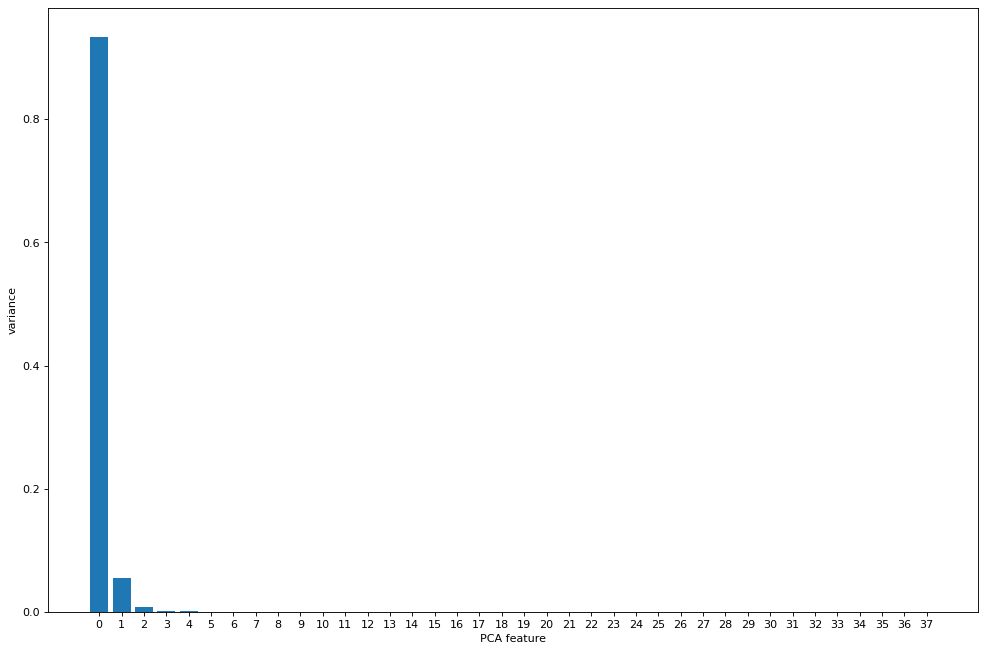

In [40]:
figure(figsize=(15, 10), dpi=80)

features = range(model.n_components_)

plt.bar(features, model.explained_variance_ratio_)
plt.xlabel('PCA feature')
plt.ylabel('variance')
plt.xticks(features)
plt.show()

### Most important are the 4 first columns

In [24]:
column_to_num = list()

for column,types in zip(X.columns,X.dtypes):
    if  types =='float64' or types == 'int64':
        column_to_num.append(column)
    else:
        continue        
column_to_num

X[column_to_num]

,disbursed_amount,asset_cost,ltv,branch_id,supplier_id,manufacturer_id,Current_pincode_ID,State_ID,MobileNo_Avl_Flag,Aadhar_flag,PAN_flag,VoterID_flag,Driving_flag,Passport_flag,PERFORM_CNS.SCORE,PRI.NO.OF.ACCTS,PRI.ACTIVE.ACCTS,PRI.OVERDUE.ACCTS,PRI.CURRENT.BALANCE,PRI.SANCTIONED.AMOUNT,PRI.DISBURSED.AMOUNT,SEC.NO.OF.ACCTS,SEC.ACTIVE.ACCTS,SEC.OVERDUE.ACCTS,SEC.CURRENT.BALANCE,SEC.SANCTIONED.AMOUNT,SEC.DISBURSED.AMOUNT,PRIMARY.INSTAL.AMT,SEC.INSTAL.AMT,NEW.ACCTS.IN.LAST.SIX.MONTHS,DELINQUENT.ACCTS.IN.LAST.SIX.MONTHS,AVERAGE.ACCT.AGE,CREDIT.HISTORY.LENGTH,NO.OF_INQUIRIES
0,50578.0,58400.0,89.55,67.0,22807.0,45.0,1441.0,6.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,47145.0,65550.0,73.23,67.0,22807.0,45.0,1502.0,6.0,1.0,1.0,0.0,0.0,0.0,0.0,598.0,1.0,1.0,1.0,27600.0,50200.0,50200.0,0.0,0.0,0.0,0.0,0.0,0.0,1991.0,0.0,0.0,1.0,23.0,23.0,0.0
2,53278.0,61360.0,89.63,67.0,22807.0,45.0,1497.0,6.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,57513.0,66113.0,88.48,67.0,22807.0,45.0,1501.0,6.0,1.0,1.0,0.0,0.0,0.0,0.0,305.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31.0,0.0,0.0,0.0,8.0,15.0,1.0
4,52378.0,60300.0,88.39,67.0,22807.0,45.0,1495.0,6.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233149,63213.0,105405.0,60.72,34.0,20700.0,48.0,1050.0,6.0,1.0,0.0,0.0,1.0,0.0,0.0,735.0,4.0,3.0,0.0,390443.0,416133.0,416133.0,0.0,0.0,0.0,0.0,0.0,0.0,4084.0,0.0,0.0,0.0,21.0,39.0,0.0
233150,73651.0,100600.0,74.95,34.0,23775.0,51.0,990.0,6.0,1.0,0.0,0.0,1.0,0.0,0.0,825.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1565.0,0.0,0.0,0.0,6.0,6.0,0.0
233151,33484.0,71212.0,48.45,77.0,22186.0,86.0,2299.0,4.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
233152,34259.0,73286.0,49.10,77.0,22186.0,86.0,2299.0,4.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Create OneHotEncoder for numeric and category values

In [18]:


# A class to select numerical or categorical columns 
# since Scikit-Learn doesn't handle DataFrames yet
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names]

In [19]:
# Inspired from stackoverflow.com/questions/25239958
class MostFrequentImputer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.most_frequent_ = pd.Series([X[c].value_counts().index[0] for c in X],
                                        index=X.columns)
        return self
    def transform(self, X, y=None):
        return X.fillna(self.most_frequent_)

## OneHotEncoder for category values

In [20]:
# from future_encoders import OneHotEncoder
from sklearn.preprocessing import OneHotEncoder

cat_pipeline = Pipeline([
        ("select_cat", DataFrameSelector(column_to_cat)),
        ("imputer", MostFrequentImputer()),
        ("cat_encoder", OneHotEncoder(sparse=False, handle_unknown = 'ignore')),
    ])

In [21]:
cat_pipeline.fit_transform(X_train)

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [22]:
column_to_convert

['disbursed_amount',
 'asset_cost',
 'branch_id',
 'supplier_id',
 'manufacturer_id',
 'Current_pincode_ID',
 'State_ID',
 'MobileNo_Avl_Flag',
 'Aadhar_flag',
 'PAN_flag',
 'VoterID_flag',
 'Driving_flag',
 'Passport_flag',
 'PERFORM_CNS.SCORE',
 'PRI.NO.OF.ACCTS',
 'PRI.ACTIVE.ACCTS',
 'PRI.OVERDUE.ACCTS',
 'PRI.CURRENT.BALANCE',
 'PRI.SANCTIONED.AMOUNT',
 'PRI.DISBURSED.AMOUNT',
 'SEC.NO.OF.ACCTS',
 'SEC.ACTIVE.ACCTS',
 'SEC.OVERDUE.ACCTS',
 'SEC.CURRENT.BALANCE',
 'SEC.SANCTIONED.AMOUNT',
 'SEC.DISBURSED.AMOUNT',
 'PRIMARY.INSTAL.AMT',
 'SEC.INSTAL.AMT',
 'NEW.ACCTS.IN.LAST.SIX.MONTHS',
 'DELINQUENT.ACCTS.IN.LAST.SIX.MONTHS',
 'AVERAGE.ACCT.AGE',
 'CREDIT.HISTORY.LENGTH',
 'NO.OF_INQUIRIES',
 'loan_default']

## OneHotEncoder for numerical values values

In [23]:
num_pipeline = Pipeline([
        ("select_numeric", DataFrameSelector(column_to_num)),
        ("imputer", SimpleImputer(strategy="median")),
    ])

In [24]:
num_pipeline.fit_transform(X_train)

array([[4.3394e+04, 7.2594e+04, 6.1990e+01, ..., 1.2000e+01, 4.7000e+01,
        0.0000e+00],
       [4.5869e+04, 8.5174e+04, 5.6360e+01, ..., 7.0000e+00, 7.0000e+00,
        0.0000e+00],
       [5.7259e+04, 7.3508e+04, 8.0260e+01, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       ...,
       [4.3849e+04, 6.1000e+04, 7.4590e+01, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [5.0803e+04, 6.8915e+04, 7.4730e+01, ..., 6.0000e+00, 6.0000e+00,
        0.0000e+00],
       [4.6849e+04, 7.5000e+04, 6.4670e+01, ..., 8.0000e+00, 8.0000e+00,
        0.0000e+00]])

## Check correlation between column and delete non-imporcance

In [25]:
import seaborn as sns
sns.pairplot(data=X_train, height=8)
plt.show()

In [ ]:
# pca = PCA()
# pca.fit(scale(X_train))
# plt.bar(range(1,1+pca.n_components_),pca.explained_variance_ratio_)
# plt.show()

In [ ]:
# # Create correlation matrix
# corr_matrix = X.corr().abs()

# # Select upper triangle of correlation matrix
# upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# # Find features with correlation greater than 0.95
# to_drop = [column for column in upper.columns if any(upper[column] > 0.80)]

In [ ]:
# X.drop(columns=to_drop,inplace=True)

In [ ]:
# from sklearn.decomposition import PCA
# pca = PCA()
# pca.fit(X)
# plt.bar(range(pca.n_components_),pca.explained_variance_ratio_)
# plt.show()